In [1]:
!pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 KB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.2/112.2 KB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.2/111.2 KB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 52.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.4/129.4 KB 9.4 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.25.1
    Uninstalling requests-2.25.1:
      Successfully uninstalled requests-2.25.1
  Attempting uninstall: html5lib
    Found existing installation: html5lib 1.0.1
    Uninstalling html5lib-1.0.1:
      Successfully uninstalled html5lib-1.0.1
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.6.3
   

In [2]:
from datetime import date
import pandas as pd
import pandas_datareader.data as pdr
import yfinance as yf
yf.pdr_override()

In [3]:
def obtain_data(ticker,startdate,enddate):
   df = pdr.get_data_yahoo(ticker, start=startdate,end=enddate)
   df=df.rename({'Open':'open_price','Close':'close_price','High':'high','Low':'low','Volume':'volume'},axis='columns')
   return df

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [5]:
"""This cell defineds the plot_candles function"""

def plot_candles(pricing, title=None, volume_bars=False, color_function=None, technicals=None):
    """ Plots a candlestick chart using quantopian pricing data.
    
    Author: Daniel Treiman
    
    Args:
      pricing: A pandas dataframe with columns ['open_price', 'close_price', 'high', 'low', 'volume']
      title: An optional title for the chart
      volume_bars: If True, plots volume bars
      color_function: A function which, given a row index and price series, returns a candle color.
      technicals: A list of additional data series to add to the chart.  Must be the same length as pricing.
    """
    def default_color(index, open_price, close_price, low, high):
        return 'r' if open_price[index] > close_price[index] else 'g'
    color_function = color_function or default_color
    technicals = technicals or []
    open_price = pricing['open_price']
    close_price = pricing['close_price']
    low = pricing['low']
    high = pricing['high']
    oc_min = pd.concat([open_price, close_price], axis=1).min(axis=1)
    oc_max = pd.concat([open_price, close_price], axis=1).max(axis=1)
    
    if volume_bars:
        fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))
    else:
        fig, ax1 = plt.subplots(1, 1)
    if title:
        ax1.set_title(title)
    fig.tight_layout()
    x = np.arange(len(pricing))
    candle_colors = [color_function(i, open_price, close_price, low, high) for i in x]
    candles = ax1.bar(x, oc_max-oc_min, bottom=oc_min, color=candle_colors, linewidth=0)
    lines = ax1.vlines(x , low, high, color=candle_colors, linewidth=1)
    ax1.xaxis.grid(True)
    ax1.yaxis.grid(True)
    ax1.xaxis.set_tick_params(which='major', length=3.0, direction='in', top='off')
    ax1.set_yticklabels([])
    # Assume minute frequency if first two bars are in the same day.
    frequency = 'minute' if (pricing.index[1] - pricing.index[0]).days == 0 else 'day'
    time_format = '%d-%m-%Y'
    if frequency == 'minute':
        time_format = '%H:%M'
    # Set X axis tick labels.
    #plt.xticks(x, [date.strftime(time_format) for date in pricing.index], rotation='vertical')
    for indicator in technicals:
        ax1.plot(x, indicator)
    
    if volume_bars:
        volume = pricing['volume']
        volume_scale = None
        scaled_volume = volume
        if volume.max() > 1000000:
            volume_scale = 'M'
            scaled_volume = volume / 1000000
        elif volume.max() > 1000:
            volume_scale = 'K'
            scaled_volume = volume / 1000
        ax2.bar(x, scaled_volume, color=candle_colors)
        volume_title = 'Volume'
        if volume_scale:
            volume_title = 'Volume (%s)' % volume_scale
        #ax2.set_title(volume_title)
        ax2.xaxis.grid(True)
        ax2.set_yticklabels([])
        ax2.set_xticklabels([])
    return fig    

In [7]:
def get_ativos(file):
    file = file
    x1 = pd.read_excel(file)
    Filtro = x1['Filtro'] != 1
    x1 = x1[Filtro]
    tickers = x1.Codigo[0:90]+".SA"
    tickers = pd.DataFrame(tickers)
    tickers = tickers.reset_index()
    tickers = tickers['Codigo']
    return tickers

equities=pd.Series(get_ativos('ibovespa.xls'))

[*********************100%***********************]  1 of 1 completed
Up 2 4
Up 3 3
Down 33 4
Down 34 3
Down 35 2
Down 36 1
Up 37 3
Up 38 2
Up 39 1
Down 44 4
Up 50 3
Up 51 4
Down 83 3
Up 94 4
Up 95 4
Up 96 3
Down 108 4
Down 109 3
Down 110 4
Down 111 3
Down 112 2
Down 113 2
Down 114 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 118 2
Down 124 3
Down 125 2
Down 128 4
Down 129 3
Down 130 2
Up 134 3
Up 140 4
Up 141 3
Up 142 2
Down 180 4
Down 181 3
Down 182 2
Up 186 4
Up 187 3
Up 188 2
Up 189 2
Up 197 4
Up 198 4
Up 207 4
Up 208 3
Down 211 4
Down 212 3
Down 214 4
Down 215 4
Down 216 3
Down 217 2
Down 218 4
Up 241 4
Up 242 4
Up 244 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 7 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 8 3
Down 9 2
Down 18 3
Down 20 3
Down 39 4
Down 40 3
Down 41 2
Up 48 4
Up 49 3
Up 50 2
Down 63 4
Down 65 4
Up 81 4
Up 84 3
Down 129 4
Up 133 4
Up 134 3
Up 135 2
Down 147 4
Down 148 1
Up 160 3
Up 161 2
Up 162 1
Up 171 3
Up 172 2
Up 186 4
Up 187 2
Up 188 4
Down 194 3
Up 205 3
Up 206 4
Up 207 3
Down 208 3
Down 209 2
Down 210 1
Down 211 3
Down 228 3
Down 230 4
Up 240 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 39 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 4
Up 5 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 8 4
Up 9 4
Up 10 3
Up 11 2
Down 16 3
Up 29 2
Down 31 4
Down 32 3
Down 33 3
Down 34 2
Down 39 4
Down 40 3
Down 41 2
Down 42 1
Down 44 4
Down 45 3
Down 46 2
Up 48 4
Up 49 3
Up 50 2
Up 51 3
Up 52 4
Up 53 3
Up 54 3
Up 55 2
Up 56 3
Down 62 3
Down 63 4
Down 64 4
Down 73 4
Down 82 4
Down 83 2
Down 84 2
Up 86 4
Up 87 4
Down 96 3
Down 99 4
Down 100 3
Down 101 4
Down 102 4
Down 103 4
Down 104 2
Down 106 4
Down 107 3
Down 108 3
Down 109 1
Down 110 2
Up 123 4
Up 124 3
Up 125 2
Up 126 1
Down 137 4
Down 138 3
Down 140 4
Down 142 3
Up 151 4
Down 152 2
Up 153 2
Up 154 1
Down 155 3
Down 156 2
Up 157 3
Up 158 2
Up 159 1
Up 160 1
Down 163 4
Down 164 4
Down 165 4
Down 167 4
Up 170 4
Up 171 2
Up 172 2
Up 186 4
Up 187 2
Up 188 2
Up 189 3
Down 193 4
Down 194 3
Down 195 2
Down 196 4
Down 197 4
Down 198 3
Down 199 2
Down 200 1
Up 205 3
Up 206 4
Down 210 4
Down 211 3
Down 212 3
Down 213 2
Down 214 2
Down 215 3
Down 216 3
Down 217 2
Up 223 1
Down 224 2
Down 225 4
Down 227 4
Down 228 3
Down 230 4
Down 236 4
Do

<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 3
Up 11 2
Up 12 4
Up 15 2
Up 53 4
Down 83 3
Up 144 4
Up 145 3
Up 205 3
Down 211 4
Down 212 3
Down 213 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 4
Down 1 3


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 53 4
Up 54 4
Up 146 4
Up 204 4
Up 205 2
Up 206 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 3 4
Up 5 3


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 36 4
Down 37 3
Down 38 4
Down 39 3
Down 40 2
Down 41 2
Down 42 1
Up 43 2
Up 47 3
Up 48 2
Up 49 3
Up 53 4
Up 55 4
Down 82 4
Down 83 3
Up 86 4
Up 87 4
Up 88 2
Up 89 1
Down 101 4
Down 105 4
Down 106 4
Down 107 3
Down 108 2
Down 109 2
Down 110 1
Down 119 4
Down 137 4
Up 144 4
Up 145 3
Up 146 2
Up 147 1
Up 149 4
Up 150 4
Up 151 3
Up 152 2
Up 153 1
Down 157 2
Up 159 4
Up 160 3
Up 171 2
Down 180 4
Down 181 3
Down 182 2
Down 183 4
Up 187 2
Up 188 1
Down 194 3
Down 201 4
Down 202 2
Down 203 2
Up 205 3
Up 206 2
Up 207 2
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Up 215 2
Down 228 3
Down 233 2
Down 236 4
Up 240 2
Up 241 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 6 4
Up 10 4
Up 11 3
Up 12 2
Up 15 3
Up 16 3
Down 129 3
Up 145 4
Up 146 2
Up 147 3
Up 178 2
Up 186 4
Up 187 2
Up 188 2
Up 205 3
Up 206 4
Up 207 4
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Down 215 4
Up 240 2
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 20 2
Down 21 2
Up 27 4
Up 28 3
Up 29 2
Up 30 1
Down 33 4
Up 43 2
Down 45 3
Down 78 4
Down 79 2
Down 83 3
Up 134 4
Up 135 3
Up 136 3
Up 145 3
Up 146 2
Up 151 3
Up 161 4
Up 162 3
Up 164 1
Up 185 4
Up 186 3
Up 187 2
Up 188 2
Up 205 3
Down 217 3
Down 232 4
Down 233 3
Up 240 3
Up 241 4
Up 242 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 183 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 1 4
Up 5 3


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 6 3
Up 8 4
Up 11 3
Up 53 3
Down 63 4
Down 108 4
Down 211 4
Down 212 4
Down 213 3
Down 214 2
Down 215 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 210 4
Down 211 3
Down 212 2
Down 213 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 210 4
Down 211 3
Down 212 2
Down 213 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 37 3
Up 38 2
Up 39 3
Up 40 3
Up 49 4
Down 129 4
Up 186 4
Up 187 3
Up 215 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 27 4
Up 149 4
Up 150 4
Up 151 3
Up 152 2
Up 197 4
Up 198 3
Up 199 3
Down 201 4
Down 202 1
Down 233 4
Down 234 4
Down 235 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 18 3
Up 20 4
Down 110 4
Down 111 3
Down 112 3
Up 191 4
Up 192 3
Up 193 2
Up 194 1
Up 195 1
Down 211 3
Down 212 3
Up 215 1
Down 230 4
Down 237 3
Down 238 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 18 4
Down 19 3
Down 20 2
Down 21 3
Down 36 2
Down 37 3
Down 38 4
Down 39 4
Down 40 3
Down 41 2
Up 43 2
Up 48 4
Down 65 4
Down 66 3
Down 67 4
Down 73 4
Down 82 3
Down 83 2
Up 86 4
Up 87 3
Up 88 2
Up 89 1
Up 98 4
Down 108 4
Down 109 3
Down 110 2
Down 111 4
Up 115 3
Up 116 2
Up 117 2
Up 122 4
Up 123 3
Up 124 2
Down 149 4
Down 150 3
Down 151 2
Down 152 1
Up 153 2
Up 154 2
Down 200 4
Down 201 3
Down 202 2
Down 203 1
Down 211 4
Down 212 3
Down 217 3
Down 224 4
Down 225 4
Down 226 3
Down 227 2
Down 228 3
Down 233 3
Up 245 4
Up 246 3
Up 247 2
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 9 4
Up 11 2
Up 12 4
Up 14 4
Up 15 3
Up 145 3
Up 146 4
Down 180 4
Up 205 4
Down 211 4
Down 213 3
Down 214 4
Down 230 4
Down 232 4
Down 233 4
Up 240 3
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 14 4
Up 15 3
Up 37 3
Up 38 3
Down 108 4
Up 141 3
Down 211 4
Down 212 3
Down 213 2
Down 214 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 43 2
Up 53 4
Down 211 4
Down 213 2
Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 49 4
Up 50 3
Down 78 4
Down 79 3
Down 182 4
Down 183 4
Down 184 3
Up 185 4
Up 186 3
Up 187 2
Up 188 1
Up 220 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 15 4
Up 30 4
Up 31 3
Up 32 2
Up 33 1
Down 39 4
Down 41 2
Up 43 2
Up 58 4
Up 59 3
Up 60 2
Up 65 4
Up 88 4
Up 95 4
Up 96 3
Up 97 2
Up 98 1
Up 143 4
Up 144 4
Up 145 2
Up 146 2
Up 185 4
Up 205 3
Up 240 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 2
Down 1 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 4
Up 12 4
Up 53 4
Up 54 3
Up 55 2
Up 56 1
Up 58 4
Down 64 4
Down 73 2
Up 86 3
Up 87 2
Up 88 4
Down 108 4
Down 109 3
Down 110 2
Up 124 4
Up 125 2
Up 126 2
Up 144 4
Up 145 3
Up 146 2
Up 178 4
Up 203 4
Up 204 4
Up 205 2
Down 208 4
Down 209 3
Down 210 3
Down 211 2
Down 212 4
Down 213 3
Down 214 2
Down 215 4
Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 77 4
Down 78 3
Down 79 2
Up 199 4
Up 205 4
Up 206 3
Up 207 2
Up 217 4
Up 218 3
Up 219 2
Up 220 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 32 4
Down 33 3
Up 50 4
Down 82 4
Down 83 3
Up 95 4
Up 96 4
Down 182 4
Down 190 4
Down 191 3
Down 192 2
Up 207 3
Up 208 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 77 4
Down 78 3
Down 79 2
Down 80 1
Down 211 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 38 4
Down 45 4
Down 46 3
Down 47 2
Down 73 4
Down 83 3
Down 84 3
Down 85 2
Up 93 2
Up 100 4
Up 101 3
Down 110 4
Down 111 3
Down 112 4
Down 113 4
Down 121 4
Down 122 4
Up 186 4
Up 187 3
Up 188 2
Down 193 4
Down 194 3
Up 207 4
Up 208 3
Up 209 4
Up 210 3
Up 211 4
Up 212 3
Up 234 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 2


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 3
Up 11 2
Up 12 1
Up 16 4
Down 20 4
Down 21 4
Up 29 3
Up 30 2
Down 32 3
Down 33 4
Down 34 4
Down 36 4
Down 38 4
Down 39 3
Down 40 3
Down 41 2
Down 42 1
Up 43 2
Up 44 1
Down 45 3
Up 47 3
Up 48 2
Up 49 1
Up 50 2
Up 51 2
Up 52 4
Up 53 3
Up 54 2
Up 55 3
Down 63 4
Down 64 3
Down 83 3
Up 86 4
Up 88 2
Down 93 4
Down 94 3
Down 95 3
Down 96 2
Down 107 4
Down 108 3
Down 109 2
Down 110 1
Up 111 3
Up 112 1
Up 113 1
Down 115 4
Down 116 4
Down 117 3
Down 118 3
Down 119 3
Down 120 2
Down 121 4
Up 126 2
Up 127 1
Up 141 2
Up 144 4
Up 145 3
Up 146 2
Down 148 3
Down 149 4
Down 150 1
Up 151 4
Up 152 3
Up 153 2
Down 156 4
Down 157 3
Up 159 3
Up 160 2
Up 161 1
Up 171 2
Up 172 2
Down 174 4
Down 181 3
Up 187 2
Up 188 3
Up 197 2
Down 203 2
Up 205 3
Up 206 2
Up 207 2
Down 209 4
Down 210 3
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Down 221 2
Down 222 4
Down 224 2
Down 230 4
Down 233 1
Down 236 4
Down 237 3
Down 238 2
Up 239 4
Up 240 2
Up 241 4
Up 242 3
246
247
248
249
[*********************100%**********

<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 4
Up 11 2
Up 12 4
Up 13 4
Up 14 4
Up 15 3
Down 39 4
Up 48 4
Up 49 3
Up 50 4
Up 51 3
Up 53 4
Up 54 3
Up 55 2
Down 63 4
Up 144 4
Up 145 3
Up 146 2
Up 147 1
Up 165 4
Up 166 3
Up 167 2
Up 184 4
Up 185 3
Up 186 3
Up 187 2
Up 205 3
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Down 217 3
Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 15 3
Up 16 2
Up 48 4
Up 49 3
Up 144 4
Up 145 3
Up 146 2
Up 147 1
Down 182 4
Down 183 4
Up 205 3
Up 206 3
Up 207 3
Down 211 4
Down 214 1
Down 216 4
Down 217 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 43 2
Up 47 4
Up 48 2
Up 49 2
Down 81 4
Down 82 3
Down 83 2
Down 84 2
Up 89 4
Up 91 4
Up 92 4
Up 93 4
Up 94 3
Down 107 4
Down 109 2
Up 145 3
Up 146 2
Up 147 3
Up 171 3
Up 172 2
Down 173 4
Down 174 3
Down 175 2
Down 176 1
Down 183 3
Up 186 4
Up 187 2
Up 188 1
Up 205 4
Down 210 4
Down 211 3
Down 212 3
Down 213 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 64 3
Down 211 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 64 3
Down 211 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 32 4
Down 33 4
Down 34 3
Down 39 4
Down 40 3
Down 42 4
Down 43 4
Down 44 2
Down 45 1
Up 47 4
Up 48 3
Up 49 3
Down 83 4
Down 84 4
Down 107 4
Down 108 3
Down 109 2
Up 115 4
Up 144 4
Up 145 3
Up 146 3
Down 180 4
Up 188 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
246
247
248
249
[*********************100%***********************]  1 of 1 completed
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 48 4
Up 49 3
Up 50 2
Up 51 3
Up 53 3
Up 88 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 187 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 4
Up 11 2
Down 20 4
Up 48 4
Up 49 3
Up 50 4
Up 51 3
Up 53 4
Down 62 4
Down 63 4
Up 123 4
Up 124 3
Up 125 2
Down 131 4
Down 132 3
Up 146 2
Up 151 4
Up 153 4
Up 165 4
Up 166 3
Up 167 2
Up 185 4
Up 186 3
Up 187 2
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Down 215 4
Down 216 4
Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 2 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 119 4
Up 120 3
Up 121 2
Up 122 1
Up 188 4
Down 194 4
Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 37 3
Up 38 2
Up 39 2
Up 49 3
Down 73 4
Up 93 4
Down 107 4
Down 108 3
Down 110 4
Down 111 3
Up 210 4
Up 212 4
Up 213 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 37 4
Up 38 2
Up 39 3
Down 73 4
Down 107 4
Down 108 3
Down 110 4
Down 111 3
Down 113 4
Up 212 4
Up 213 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 29 2
Down 37 4
Down 38 4
Down 39 3
Down 40 2
Down 41 2
Down 42 1
Up 43 2
Up 44 1
Down 45 3
Up 48 3
Up 49 3
Up 53 4
Up 54 3
Up 55 4
Down 74 4
Down 82 4
Down 83 3
Up 86 4
Up 87 3
Up 88 2
Up 89 1
Down 106 4
Down 107 3
Down 108 2
Down 109 2
Down 110 1
Down 119 3
Down 120 3
Down 126 4
Down 127 3
Down 129 1
Up 138 4
Up 139 3
Up 140 2
Up 141 1
Up 144 4
Up 145 3
Up 146 2
Up 147 1
Up 151 3
Up 153 2
Down 157 3
Up 159 4
Up 160 2
Down 163 3
Down 164 3
Up 171 2
Down 180 4
Down 181 3
Down 182 2
Down 183 4
Up 187 2
Up 188 1
Down 193 4
Down 194 3
Down 201 4
Down 202 2
Down 203 2
Up 205 3
Up 206 2
Up 207 2
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Up 215 2
Down 235 4
Down 236 3
Down 237 2
Down 238 2
Up 239 4
Up 240 2
Up 241 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 2
Down 1 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 7 4
Up 11 3
Up 12 2
Up 24 3
Up 25 2
Down 32 3
Down 33 2
Down 39 4
Up 43 2
Up 44 1
Down 45 2
Up 47 3
Up 48 2
Up 49 2
Down 70 4
Down 71 3
Down 72 2
Down 73 1
Down 82 4
Down 83 3
Down 84 2
Up 86 3
Down 107 4
Down 108 3
Down 109 2
Down 110 2
Down 113 2
Up 115 4
Up 124 4
Up 125 3
Up 126 2
Up 130 2
Up 144 3
Up 145 2
Up 146 1
Down 148 3
Down 150 2
Down 151 3
Down 152 2
Down 153 1
Up 159 3
Up 160 2
Up 161 2
Down 163 3
Up 171 3
Up 172 2
Down 174 4
Down 177 1
Down 182 3
Down 183 4
Down 190 4
Up 197 2
Up 198 3
Down 208 4
Down 209 4
Up 229 1
Down 233 4
Down 236 4
Up 240 2
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 2
Down 1 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 3
Up 11 2
Up 12 2
Up 13 4
Up 14 4
Up 15 2
Up 16 2
Down 40 3
Down 41 2
Up 43 2
Down 45 3
Up 51 4
Up 52 3
Up 53 2
Up 54 2
Down 64 4
Down 73 4
Down 74 3
Down 82 4
Down 83 3
Down 108 4
Up 124 4
Up 125 3
Up 144 4
Up 145 3
Up 146 2
Up 150 4
Up 151 3
Up 178 4
Up 188 4
Up 205 3
Up 206 4
Down 211 4
Down 212 3
Down 213 2
Down 214 2
Down 228 3
Down 233 4
Up 239 4
Up 240 2
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 5 2


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 4
Up 11 3
Up 12 4
Up 13 4
Up 15 2
Up 27 4
Down 62 4
Down 63 3
Down 64 4
Down 74 4
Down 76 4
Down 77 3
Down 88 4
Down 89 3
Down 90 2
Down 91 1
Down 102 4
Down 103 3
Down 104 3
Down 114 4
Up 121 4
Up 122 3
Up 123 2
Up 124 2
Down 131 3
Down 132 3
Up 141 2
Up 150 4
Up 151 3
Up 152 2
Up 153 1
Up 160 3
Down 174 4
Up 178 4
Up 187 3
Up 204 4
Up 205 3
Up 206 2
Up 207 4
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Down 215 3
Down 216 3
Down 217 1
Down 232 4
Down 233 3
Down 234 3
Up 239 4
Up 240 3
Up 241 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 204 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 3
Up 3 4
Up 4 3
Up 5 2


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 6 3
Up 53 4
Up 54 3
Up 55 4
Up 88 4
Up 187 4
Down 211 4
Down 212 3
Down 213 3
Down 214 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 185 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 23 3
Up 24 3
Up 215 1
Down 216 3
Down 217 2
Down 218 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 11 3
Up 12 2
Down 39 4
Up 53 4
Up 146 4
Up 187 3
Up 205 3
Down 211 4
Down 214 4
Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 2
Down 1 1
Down 4 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 5 3
Down 6 2
Down 7 2
Down 8 3
Down 10 1
Up 11 1
Up 17 4
Down 21 2
Up 23 1
Up 28 3
Up 29 2
Up 30 1
Down 31 4
Down 32 3
Down 33 2
Up 35 3
Down 38 4
Down 39 4
Down 40 3
Down 41 3
Up 48 2
Up 49 1
Up 51 4
Down 61 4
Down 62 3
Down 63 2
Down 64 3
Down 73 4
Down 74 3
Down 81 4
Down 82 4
Down 83 2
Down 84 2
Down 85 1
Up 88 4
Up 89 3
Up 90 3
Up 91 1
Up 92 1
Up 103 3
Down 106 4
Down 107 3
Down 108 3
Down 109 2
Down 110 2
Up 114 4
Up 115 3
Up 116 2
Up 117 2
Up 123 4
Up 124 3
Up 125 2
Down 131 4
Down 132 3
Up 133 4
Up 134 3
Up 135 2
Up 136 1
Up 141 4
Up 142 4
Up 143 3
Up 144 2
Up 145 2
Up 146 1
Up 150 4
Up 151 3
Up 152 3
Up 153 1
Up 186 4
Up 187 2
Up 188 2
Up 189 3
Down 192 3
Down 193 4
Up 197 2
Down 202 3
Down 203 2
Down 204 1
Up 205 3
Up 206 2
Down 208 4
Down 209 3
Down 210 2
Down 211 4
Down 212 4
Down 213 3
Down 214 1
Down 215 3
Down 217 2
Up 225 3
Up 226 2
Up 227 3
Down 230 3
Down 231 3
Up 240 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 3
Up 11 2
Down 39 4
Down 40 3
Down 41 2
Up 43 2
Up 51 4
Up 52 4
Up 53 3
Up 54 2
Down 105 4
Down 106 4
Down 107 4
Down 108 3
Up 144 4
Up 145 3
Up 146 2
Up 187 2
Up 188 4
Up 204 4
Up 205 3
Down 211 4
Down 212 3
Down 213 3
Down 214 2
Down 224 2
Down 227 4
Down 228 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 1 4
Down 2 3
Up 5 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 4
Up 11 2
Up 15 3
Down 31 4
Down 32 3
Down 33 4
Down 44 4
Down 45 3
Down 46 2
Down 47 2
Up 49 2
Up 50 2
Up 52 4
Up 53 3
Up 54 2
Up 55 4
Up 58 4
Down 62 4
Down 63 4
Down 64 3
Down 73 4
Down 76 4
Down 79 3
Down 81 4
Down 82 4
Down 83 1
Down 84 2
Up 86 4
Up 87 3
Up 88 2
Down 89 4
Down 90 2
Down 91 1
Up 95 4
Up 96 3
Down 103 4
Down 104 2
Down 105 3
Down 106 3
Down 107 3
Down 108 3
Down 109 2
Down 110 2
Down 111 3
Down 121 4
Down 122 3
Up 124 3
Up 125 1
Up 126 3
Up 127 4
Up 128 3
Up 129 2
Up 130 1
Up 134 3
Up 135 2
Up 136 1
Down 137 4
Down 138 3
Up 144 3
Up 145 3
Up 146 2
Up 147 1
Up 151 3
Up 152 3
Up 153 1
Up 154 1
Up 158 4
Up 159 3
Up 160 2
Up 161 2
Up 170 4
Up 171 3
Up 172 2
Down 181 4
Down 183 4
Up 185 4
Up 186 3
Up 187 1
Up 188 2
Down 193 4
Down 194 3
Down 195 2
Down 196 1
Up 205 2
Up 206 4
Up 207 3
Down 211 4
Down 212 3
Down 213 2
Down 214 1
Down 215 1
Down 217 3
Up 220 4
Down 230 4
Down 232 3
Down 236 4
Down 237 3
Up 240 1
246
247
248
249
[*********************100%*************

<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 6 3
Down 19 4
Down 20 3
Up 23 4
Up 24 4
Down 45 2
Down 67 4
Down 68 4
Down 79 4
Down 80 3
Down 81 3
Down 82 2
Down 83 4
Up 100 4
Down 110 2
Down 111 4
Up 123 4
Up 134 4
Up 135 2
Up 151 3
Up 152 2
Up 153 3
Down 169 3
Down 182 4
Down 183 4
Down 214 4
Down 216 2
Down 217 4
Down 224 4
Down 225 4
Down 226 3
Down 227 2
Down 228 3
Down 239 3
Down 240 2
Down 241 1
Up 242 3
Up 243 2
Up 244 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 2
Down 1 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 9 4
Up 10 3
Up 11 2
Down 31 4
Down 32 4
Down 33 4
Down 34 4
Down 39 4
Down 40 3
Down 41 2
Down 45 2
Down 46 2
Up 48 4
Up 49 3
Up 50 2
Up 51 4
Up 52 4
Up 53 3
Up 54 2
Up 55 4
Up 58 4
Down 62 3
Down 63 2
Down 64 2
Down 65 4
Down 66 3
Down 83 2
Up 86 3
Up 87 3
Up 88 2
Up 89 2
Down 102 4
Down 103 3
Down 104 2
Down 105 4
Down 107 4
Down 108 3
Down 109 2
Down 110 1
Down 111 4
Down 113 3
Down 118 4
Down 119 3
Up 123 4
Up 124 3
Up 125 2
Down 129 4
Down 131 4
Up 144 4
Up 145 3
Up 146 2
Up 147 1
Up 151 4
Up 152 3
Up 153 2
Up 154 1
Down 155 2
Down 156 3
Down 157 3
Up 160 2
Down 181 4
Down 183 4
Up 186 4
Up 187 2
Up 188 3
Up 189 3
Down 192 4
Down 193 4
Down 194 3
Up 205 2
Up 206 2
Up 207 3
Up 208 2
Down 210 4
Down 211 4
Down 212 3
Down 213 2
Up 215 2
Up 216 1
Up 232 3
Up 233 2
Up 237 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 23 4
Up 24 3
Up 35 3
Up 37 3
Up 96 4
Up 97 4
Up 98 3
Up 116 4
Up 151 3
Up 152 4
Up 160 3
Up 192 4
Up 193 3
Up 215 1
Down 216 2
Down 217 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 11 3
Up 12 4
Up 13 4
Up 14 4
Up 15 3
Up 43 2
Up 44 1
Down 45 2
Down 46 1
Up 51 3
Up 52 4
Up 53 3
Up 54 2
Up 55 4
Down 62 4
Down 63 4
Down 83 2
Up 97 2
Up 121 3
Up 124 4
Up 125 3
Up 126 2
Up 141 2
Up 144 4
Up 145 3
Up 146 2
Up 147 1
Down 149 4
Down 152 1
Up 153 2
Down 155 4
Down 156 3
Down 157 2
Up 165 4
Up 166 3
Up 167 2
Up 171 2
Down 182 3
Down 192 3
Down 193 4
Down 194 4
Down 195 3
Down 196 2
Down 197 1
Up 204 4
Up 205 3
Down 211 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 5 3


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 50 4
Up 51 3
Up 52 4
Up 53 3
Up 55 4
Up 88 3
Up 205 3
Up 206 4
Up 207 3
Down 211 4
Down 212 3
Down 213 2
Down 214 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 14 4
Up 35 4
Up 80 3
Down 83 3
Down 111 4
Down 113 4
Down 137 4
Down 138 3
Down 139 2
Up 151 3
Up 153 4
Up 166 4
Up 168 2
Up 205 3
Down 208 4
Down 209 3
Down 210 2
Down 217 2
Up 224 4
Up 225 3
Up 226 2
Down 233 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 5 3


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 96 1
Up 140 4
Down 150 4
Down 151 3
Down 152 2
Down 153 1
Up 186 3
Up 187 2
Up 188 3
Up 198 4
Up 199 3
Down 202 2
Down 207 4
Down 210 4
Down 218 4
Down 219 3
Down 220 2
Down 221 1
Up 225 3
Down 234 4
Down 235 3
Down 236 2
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 5 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 70 2
Up 81 4
Down 96 1
Up 139 4
Up 140 4
Up 141 3
Down 150 4
Down 151 3
Down 152 2
Down 153 1
Up 187 4
Up 188 4
Up 198 4
Up 199 3
Down 201 4
Down 202 2
Down 204 4
Down 207 4
Down 210 4
Down 218 4
Down 219 3
Down 220 2
Down 221 1
Up 225 3
Down 234 4
Down 235 3
Down 236 2
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 1 1
Up 2 4
Up 3 3
Up 4 4
Up 5 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 7 4
Up 26 4
Up 36 4
Up 37 3
Up 38 2
Up 39 2
Down 44 3
Down 46 4
Up 49 4
Up 50 2
Down 83 3
Up 86 4
Up 87 3
Up 94 4
Down 110 4
Down 111 3
Down 112 2
Down 113 3
Down 114 4
Down 115 3
Up 118 2
Up 134 4
Up 159 4
Up 160 2
Up 187 3
Up 188 2
Up 189 4
Up 205 4
Up 206 3
Up 207 4
Down 217 3
Down 229 4
Down 230 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 2
Up 3 4
Up 5 2


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 4
Up 11 3
Up 12 2
Up 13 4
Up 15 2
Up 28 3
Up 29 2
Down 41 2
Up 43 2
Down 45 3
Up 48 2
Down 63 4
Down 64 4
Down 81 4
Down 82 3
Down 83 2
Down 84 1
Down 85 1
Up 86 4
Up 88 3
Up 89 2
Down 91 4
Down 92 3
Down 93 2
Down 107 4
Down 108 3
Down 109 2
Up 125 2
Up 135 2
Down 137 3
Down 138 3
Up 141 2
Up 144 3
Up 145 3
Up 146 2
Down 149 4
Down 150 3
Up 153 2
Down 155 4
Down 156 3
Down 157 3
Down 158 2
Up 160 3
Down 167 4
Down 183 4
Up 187 2
Down 190 4
Down 191 4
Down 192 2
Down 193 4
Up 205 3
Down 214 4
Down 231 4
Down 232 3
Up 240 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 15 4
Down 34 4
Down 35 3
Down 36 2
Down 37 1
Up 42 3
Up 43 2
Up 44 1
Down 62 2
Down 63 2
Down 83 3
Down 84 4
Down 85 3
Down 86 2
Down 87 1
Up 88 1
Up 107 3
Up 109 4
Up 110 4
Up 111 2
Up 112 1
Down 116 3
Down 117 4
Down 118 4
Down 119 3
Down 120 2
Down 121 2
Up 123 4
Up 124 4
Down 131 4
Down 137 4
Down 138 3
Down 139 2
Up 141 2
Up 144 4
Up 145 3
Up 146 2
Up 147 4
Down 155 4
Down 156 4
Down 174 3
Up 187 2
Up 188 1
Down 193 4
Down 194 3
Down 195 3
Down 196 4
Up 204 4
Up 205 3
Up 206 3
Down 210 4
Down 211 3
Down 212 2
Down 213 1
Down 215 4
Down 216 3
Down 217 2
Down 218 1
Up 226 4
Down 230 3
Down 232 3
Down 233 3
Up 237 4
Up 238 3
Up 239 2
Up 240 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 95 4
Up 96 4
Up 141 4
Up 205 3
Down 212 4
Down 213 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 3
Down 1 2
Up 3 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 31 4
Down 32 3
Down 33 3
Up 48 4
Up 50 2
Down 78 4
Down 79 3
Down 80 2
Down 81 3
Down 82 2
Down 83 3
Up 95 4
Down 104 3
Down 105 3
Down 106 4
Down 128 3
Up 144 4
Up 145 3
Up 205 4
Up 206 4
Up 207 3
Up 208 3
Down 211 4
Down 230 4
Down 231 3
Down 232 4
Up 240 3
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 33 4
Up 34 3
Up 35 2
Down 76 4
Down 83 4
Down 84 4
Up 96 3
Up 97 3
Down 131 4
Up 134 4
Up 135 3
Up 136 2
Up 151 4
Up 153 2
Down 155 4
Down 182 3
Down 183 3
Down 184 4
Up 204 4
Up 205 3
Up 206 2
Up 222 2
Down 232 4
Down 233 3
Down 234 3
Up 239 4
Up 240 2
Up 241 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 48 4
Up 49 3
Up 50 2
Down 76 4
Down 77 4
Down 78 3
Up 98 4
Down 233 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 4
Down 1 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 58 4
Up 59 3
Up 60 2
Up 184 4
Up 185 3
Up 186 3
Up 187 2
Up 188 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 44 4
Down 202 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 37 3
Up 44 4
Up 88 4
Up 99 4
Down 104 4
Down 105 4
Down 106 4
Down 113 4
Down 114 3
Down 165 4
Down 166 3
Down 167 2
Up 205 4
Up 206 3
Up 207 2
Down 216 3
Down 217 2
Up 219 1
Down 234 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 3 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 29 4
Down 30 3
Up 37 3
Up 38 2
Up 39 2
Down 43 4
Down 44 4
Down 45 3
Down 46 2
Up 49 2
Up 50 3
Down 71 4
Down 72 3
Down 73 2
Down 74 2
Down 83 3
Down 84 3
Down 85 2
Up 92 4
Up 93 2
Up 94 3
Down 105 4
Down 106 3
Down 107 2
Down 108 3
Down 110 4
Down 113 4
Down 120 4
Down 121 3
Down 122 4
Down 129 4
Down 161 4
Down 162 4
Down 163 3
Up 186 4
Up 187 2
Up 188 3
Down 193 4
Up 198 4
Up 200 2
Up 207 4
Up 208 3
Up 212 4
Up 213 3
Up 214 2
Up 215 1
Down 224 2
Down 225 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 37 3
Up 38 3
Up 39 2
Up 40 3
Up 76 3
Down 114 4
Down 115 3
Down 116 2
Down 128 4
Down 129 2
Up 159 4
Up 160 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Down 85 3
Down 86 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed
246
247
248
249
[*********************100%***********************]  1 of 1 completed
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 11 3
Up 16 4
Up 29 3
Up 30 3
Down 73 4
Down 80 4
Down 81 4
Down 82 3
Down 83 1
Down 84 2
Down 107 4
Down 108 3
Down 109 2
Up 133 4
Up 134 3
Up 135 2
Up 149 3
Up 204 4
Up 205 3
Down 230 4
Up 240 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 15 3
Down 39 4
Up 50 4
Up 52 4
Up 53 4
Down 79 3
Up 87 4
Up 88 3
Up 89 3
Up 90 2
Down 182 3
Down 202 3
Up 205 4
Up 206 4
Up 207 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Up 2 4
Up 3 3
Up 4 2


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 37 4
Up 38 3
Down 45 4
Down 46 3
Down 73 4
Down 83 4
Up 93 3
Down 104 4
Down 105 4
Down 106 3
Down 107 4
Down 108 4
Down 110 4
Up 133 4
Down 161 3
Down 162 3
Down 163 2
Down 174 4
Up 187 2
Up 208 3
Up 215 1
Down 238 3
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 36 4
Up 37 3
Up 38 2
Up 39 3
Down 43 2
Up 49 4
Down 71 4
Down 72 3
Down 73 4
Up 169 4
Up 171 3
Up 186 4
Up 187 3
Up 210 3
Up 212 4
Up 213 3
Up 214 2
Up 215 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 0 3
Down 1 3
Down 2 3


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 10 4
Up 11 2
Down 20 4
Down 21 3
Down 39 4
Down 40 3
Up 48 4
Up 53 4
Up 55 4
Up 56 3
Down 62 3
Down 63 4
Down 64 3
Down 66 4
Down 73 4
Down 83 3
Up 88 4
Up 89 3
Up 95 4
Up 96 3
Up 97 2
Down 107 4
Down 108 3
Down 109 2
Down 110 2
Down 111 1
Down 118 3
Down 119 4
Down 120 3
Down 121 4
Down 122 3
Up 123 4
Up 124 3
Up 125 1
Up 126 1
Up 127 4
Up 135 2
Up 136 1
Down 138 3
Up 144 4
Up 145 3
Up 146 1
Up 147 1
Up 151 3
Up 152 3
Up 153 1
Up 154 1
Down 155 4
Down 156 3
Down 167 4
Up 171 2
Up 172 2
Down 183 4
Up 185 4
Up 186 3
Up 187 2
Up 188 1
Up 189 3
Down 193 4
Down 194 3
Down 195 2
Down 196 4
Down 197 4
Down 198 3
Down 199 2
Up 205 3
Down 210 4
Down 211 3
Down 212 3
Down 213 2
Down 214 2
Down 217 3
Down 224 2
Up 238 3
Up 239 3
Up 240 1
Up 241 1
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 50 4
Up 144 4
Up 187 2
Up 205 4
Up 207 4
Down 211 4
246
247
248
249
[*********************100%***********************]  1 of 1 completed
Down 1 4


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 28 3
Up 29 2
Down 31 4
Up 49 3
Down 78 4
Up 114 2
Up 185 4
Up 186 3
Up 187 2
Up 202 4
Up 203 3
Up 204 2
246
247
248
249
[*********************100%***********************]  1 of 1 completed


<ipython-input-5-5b988a81b1f4>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios': [3,1]},figsize=(7,7))


Up 15 4
Down 38 4
Down 39 4
Down 40 3
Down 41 2
Down 46 4
Down 47 4
Down 48 3
Down 49 1
Up 50 4
Up 51 1
Up 53 4
Up 54 3
Up 55 2
Up 56 3
Down 66 4
Down 67 4
Down 68 3
Down 83 3
Up 86 4
Up 87 3
Up 88 2
Up 89 1
Down 99 3
Down 104 4
Down 107 4
Down 108 3
Down 109 2
Up 124 4
Up 125 2
Up 126 2
Up 127 1
Up 144 4
Up 145 3
Up 146 2
Down 152 4
Down 153 4
Down 154 3
Down 155 1
Down 156 2
Down 174 4
Up 176 4
Up 177 3
Up 178 1
Up 179 4
Up 185 1
Down 193 4
Down 194 3
Down 195 3
Down 196 4
Up 202 4
Up 203 3
Up 204 2
Up 205 1
Up 206 3
Down 209 3
Down 210 3
Down 211 1
Down 212 3
Down 213 2
Down 214 1
Down 216 4
246
247
248
249


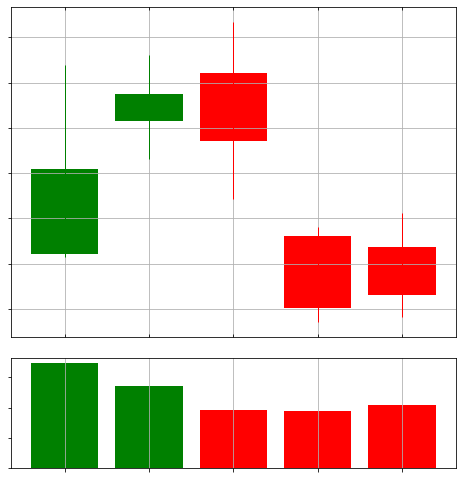

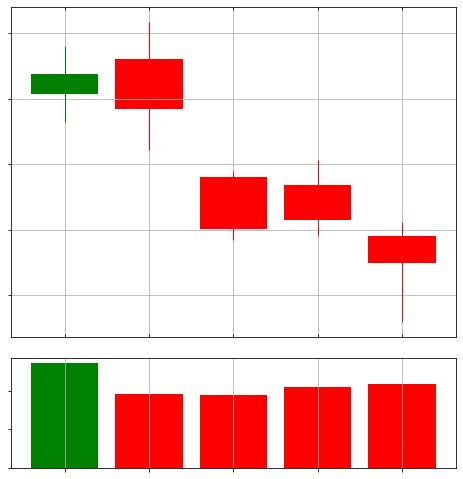

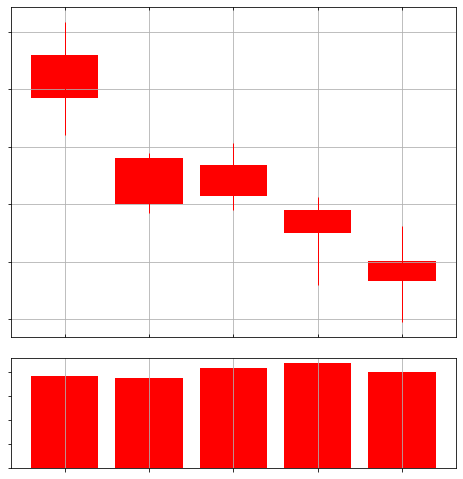

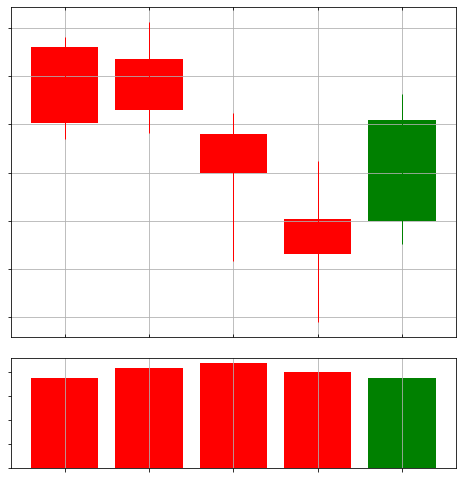

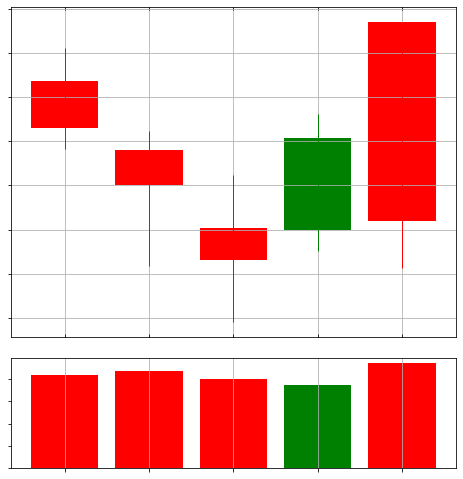

...

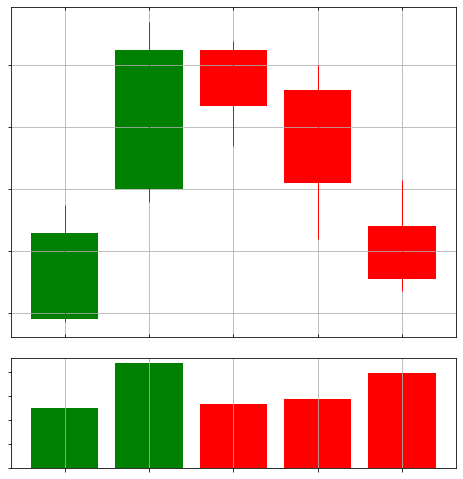

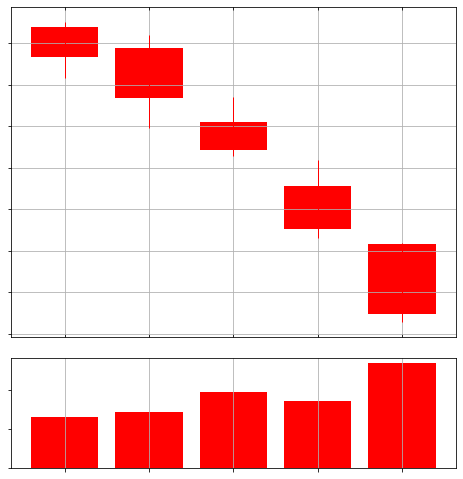

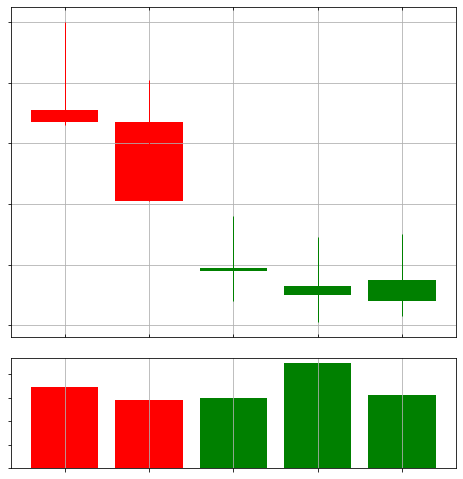

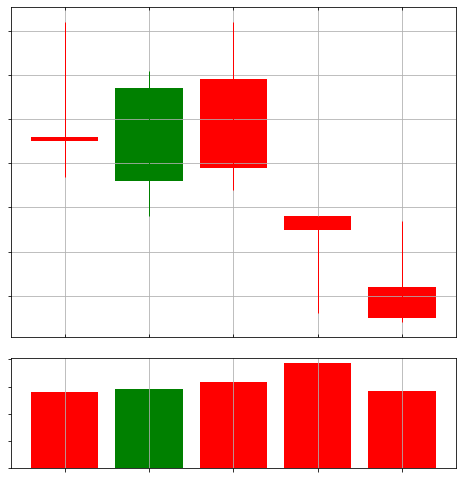

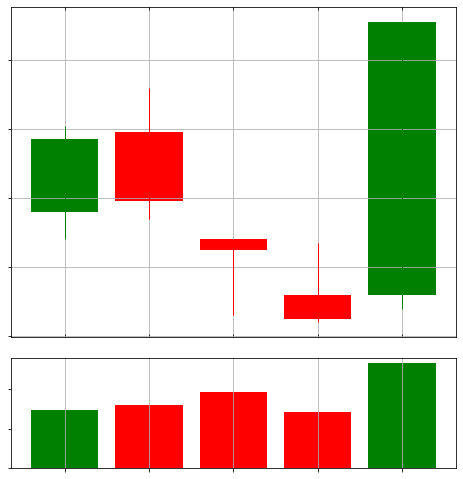

In [ ]:
for equity in equities :
    df_pricing=obtain_data(equity,date(2022,1,1),date(2022,12,31))
    df=df_pricing.copy()
    df=df.reset_index(drop=True)
    n_days=5
    fraction_movement=0.10
    df['Trend']=None
    for i in range(len(df)):
        try :
            for n in range(n_days): 
                if  df.loc[i,'close_price'] - df.loc[i+n,'close_price'] >= fraction_movement*df.loc[i,'close_price']:
                    df.loc[i,'Trend'] ='Down'
                    if i >=5 :
                        fig=plot_candles(df_pricing[i-5:i],volume_bars=True)
                        fig.savefig("drive/MyDrive/Data/candlebov/Down/{0}{1}.png".format(equity,i),dpi=70)
                    print('Down',i,n)
                    break
                elif df.loc[i+n,'close_price'] - df.loc[i,'close_price'] >= fraction_movement*df.loc[i,'close_price'] :
                    df.loc[i,'Trend']='Up'
                    if i >5 :    
                        fig=plot_candles(df_pricing[i-5:i],volume_bars=True)
                        fig.savefig("drive/MyDrive/Data/candlebov/Up/{0}{1}.png".format(equity,i),dpi=70)
                    print('Up',i,n)
                    break
                else :
                    df.loc[i,'Trend']= 'No Trend'
        except :
            print(i)
            pass

In [8]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [9]:
!pip install "torch==1.4" "torchvision==0.5.0"
!pip install "fastai==1.0.61"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 753.4/753.4 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 68.2 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 1.4.0 which is incompatible.
torchaudio 0.13.1+cu116 requires torch==1.13.1, but you have torch 1.4.0 which is incompatible.
fastai 2.7.11 requi

In [10]:
from fastai.vision import *
from fastai.metrics import error_rate

In [11]:
bs = 64
# bs = 16   # uncomment this line if you run out of memory even after clicking Kernel->Restart

In [12]:
from pathlib import Path
path=Path('drive/MyDrive/Data/candlebov')
path_save=Path('drive/MyDrive/Data/Processed')

In [13]:
path.ls()

[PosixPath('drive/MyDrive/Data/candlebov/.ipynb_checkpoints'),
 PosixPath('drive/MyDrive/Data/candlebov/Down'),
 PosixPath('drive/MyDrive/Data/candlebov/Up'),
 PosixPath('drive/MyDrive/Data/candlebov/models'),
 PosixPath('drive/MyDrive/Data/candlebov/trial.png')]

In [45]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(flip_vert=False, max_lighting=0.1, max_zoom=1.05, max_warp=0.,max_rotate=3), size=224, num_workers=4).normalize(imagenet_stats)

In [46]:
data.classes

['Down', 'Up']

In [47]:
learn = cnn_learner(data, models.vgg19_bn, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/checkpoints/vgg19_bn-c79401a0.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

In [48]:
learn.fit_one_cycle(16)

epoch,train_loss,valid_loss,error_rate,time
0,1.328713,0.802468,0.509174,05:05
1,1.288756,0.935807,0.497706,05:14
2,1.205034,0.829916,0.497706,05:14
3,1.129210,0.852989,0.483945,05:09
4,0.998433,0.790733,0.458716,05:09
5,0.903207,0.748940,0.472477,05:12
6,0.838316,0.694595,0.477064,05:12
7,0.795551,0.699691,0.467890,05:11
8,0.764191,0.763304,0.474771,05:11
9,0.742302,0.699003,0.438073,05:09


In [49]:
learn.unfreeze()

In [50]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


In [51]:
learn.recorder.plot()

In [54]:
learn.fit_one_cycle(10, max_lr=slice(1e-06,1e-05))

epoch,train_loss,valid_loss,error_rate,time
0,0.684686,0.693805,0.440367,07:28
1,0.680892,0.694272,0.438073,07:22
2,0.678815,0.694188,0.431193,07:14
3,0.673443,0.694685,0.451835,07:16
4,0.671696,0.695394,0.426605,07:12
5,0.678045,0.692746,0.428899,07:14
6,0.671436,0.691980,0.422018,07:13
7,0.667896,0.692053,0.424312,07:20
8,0.664678,0.690728,0.424312,07:10
9,0.669637,0.691389,0.419725,07:18


In [55]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


In [56]:
learn.save('Fifth Model')

In [57]:
learn.recorder.plot()

In [60]:
learn.fit_one_cycle(10, max_lr=slice(1e-04,2e-04))

epoch,train_loss,valid_loss,error_rate,time
0,0.649031,0.691424,0.435780,07:10
1,0.645679,0.696594,0.435780,07:15
2,0.644899,0.680127,0.426605,07:12
3,0.637103,0.752378,0.415138,07:12
4,0.597917,0.650745,0.371560,07:13
5,0.549176,0.702221,0.412844,07:12
6,0.489956,0.713666,0.387615,07:15
7,0.420507,0.666804,0.344037,07:11
8,0.368461,0.666489,0.348624,07:12
9,0.324700,0.668833,0.341743,07:10


In [61]:
learn.apply_dropout(m= 0.8)

In [62]:
learn.fit_one_cycle(10, max_lr=slice(1e-04,2e-04))

epoch,train_loss,valid_loss,error_rate,time
0,0.261613,0.677064,0.341743,07:10
1,0.260343,0.795423,0.362385,07:07
2,0.316770,0.802059,0.369266,07:08
3,0.327969,0.759845,0.362385,07:09
4,0.295320,0.761473,0.311927,07:06
5,0.246179,0.791125,0.344037,07:07
6,0.194647,0.816368,0.321101,07:09
7,0.149512,0.803573,0.307339,07:15
8,0.112649,0.788594,0.305046,07:07
9,0.093527,0.779377,0.305046,07:09


In [64]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


In [65]:
learn.recorder.plot()

In [67]:
learn.fit_one_cycle(10)

epoch,train_loss,valid_loss,error_rate,time
0,0.049437,1.032877,0.305046,07:04
1,0.189868,1.261070,0.438073,06:58
2,0.439754,0.972769,0.442661,07:01
3,0.489724,0.804452,0.401376,06:57
4,0.468864,0.817604,0.383028,07:02
5,0.408405,0.962267,0.316514,06:58
6,0.312880,0.893954,0.307339,07:00
7,0.238138,1.076434,0.339450,06:58
8,0.166941,0.995499,0.327982,07:00
9,0.119245,0.990558,0.321101,07:04


In [68]:
learn.save('Sixth Model')

In [69]:
correcti=0
list_down=[]
list_up=[]
for i in range(len(data.valid_ds)):
    prediction=learn.predict(data.valid_ds[i][0])
    if str(data.valid_ds[i][1])=="Down" and bool(prediction[1]==0) :
        correcti=correcti+1
        if prediction[2][0] >= 0.75 :
            list_down=list_down + [i]
            #print(prediction)
            #print()
    if str(data.valid_ds[i][1])=="Up" and bool(prediction[1]==1) :
        correcti=correcti+1
        if prediction[2][1] >= 0.75 :
            list_up=list_up + [i]
            #print(prediction)
            #print()
        

In [70]:
len(list_down),len(list_up)

(124, 136)

In [71]:
list_down

[0,
 1,
 5,
 6,
 19,
 21,
 22,
 24,
 25,
 27,
 28,
 31,
 32,
 33,
 37,
 41,
 46,
 51,
 54,
 60,
 62,
 64,
 65,
 66,
 70,
 71,
 74,
 77,
 78,
 80,
 87,
 88,
 89,
 98,
 100,
 106,
 108,
 110,
 111,
 113,
 120,
 122,
 127,
 131,
 132,
 135,
 140,
 144,
 151,
 152,
 153,
 154,
 165,
 167,
 176,
 188,
 195,
 196,
 197,
 200,
 201,
 207,
 209,
 210,
 220,
 223,
 227,
 229,
 232,
 239,
 243,
 245,
 248,
 249,
 250,
 251,
 253,
 256,
 257,
 263,
 265,
 267,
 269,
 270,
 271,
 273,
 276,
 277,
 290,
 292,
 296,
 301,
 302,
 315,
 325,
 326,
 327,
 347,
 352,
 354,
 359,
 366,
 368,
 373,
 377,
 382,
 383,
 387,
 391,
 395,
 399,
 402,
 403,
 411,
 412,
 413,
 414,
 416,
 418,
 421,
 422,
 431,
 434,
 435]

In [72]:
list_up

[3,
 7,
 15,
 26,
 29,
 39,
 44,
 48,
 49,
 50,
 56,
 58,
 59,
 68,
 72,
 73,
 75,
 81,
 82,
 83,
 92,
 93,
 95,
 97,
 102,
 103,
 104,
 105,
 107,
 115,
 118,
 119,
 124,
 125,
 126,
 129,
 130,
 133,
 136,
 138,
 141,
 143,
 147,
 149,
 155,
 157,
 159,
 160,
 161,
 163,
 166,
 168,
 170,
 171,
 172,
 173,
 174,
 180,
 181,
 183,
 185,
 190,
 191,
 194,
 198,
 205,
 206,
 211,
 212,
 214,
 218,
 221,
 222,
 225,
 228,
 230,
 233,
 234,
 240,
 241,
 247,
 252,
 255,
 258,
 261,
 268,
 274,
 275,
 279,
 286,
 288,
 291,
 293,
 295,
 297,
 300,
 304,
 306,
 308,
 312,
 314,
 317,
 321,
 322,
 333,
 342,
 348,
 350,
 351,
 355,
 358,
 360,
 361,
 363,
 365,
 375,
 378,
 381,
 388,
 389,
 390,
 392,
 393,
 394,
 401,
 406,
 409,
 410,
 415,
 419,
 423,
 424,
 426,
 427,
 430,
 433]

In [73]:
idx=433
x,y = data.valid_ds[idx]
x.show()
print(data.valid_ds.y[idx])

Up


In [74]:
xb,_ = data.one_item(x)
xb_im = Image(data.denorm(xb)[0])

In [75]:
m = learn.model.eval()

In [76]:
from fastai.callbacks.hooks import *

In [77]:
def hooked_backward(cat=y):
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(cat)].backward()
    return hook_a,hook_g

In [78]:
hook_a,hook_g = hooked_backward()

In [79]:
acts  = hook_a.stored[0].cpu()
acts.shape

torch.Size([512, 7, 7])

In [80]:
avg_acts = acts.mean(0)
avg_acts.shape

torch.Size([7, 7])

In [81]:
def show_heatmap(hm):
    fig,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(hm, alpha=0.6, extent=(0,224,224,0),
              interpolation='bilinear', cmap='magma');
    return fig

In [82]:
answer=show_heatmap(avg_acts)
answer.savefig(path/'trial.png')

In [84]:
# predict the validation set with our model
from fastai import *
from fastai.vision import *
from torchvision.models import *
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(title='Confusion matrix')